## Strabismus detection

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline

strabismus functions

In [11]:
FACE_CLASSIFIER = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
EYE_CLASSIFIER = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5))

def crop_eyes(img):  
    if img.shape is not None:
        height, width = img.shape[:2]
        eyes_h = int(height/2 - 100)
        forehead_h = int(eyes_h/3)
        img = img[forehead_h:eyes_h,0:width]
    else:
        return None
    return img

def detect_faces(img, cascade):
    gray_frame = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    coords = cascade.detectMultiScale(gray_frame, 1.3, 5)
    if len(coords) > 1:
        biggest = (0, 0, 0, 0)
        for i in coords:
            if i[3] > biggest[3]:
                biggest = i
        biggest = np.array([i], np.int32)
    elif len(coords) == 1:
        biggest = coords
    else:
        return None
    for (x, y, w, h) in biggest:
        frame = img[y:y + h, x:x + w]
    return frame

def detect_eyes(img, cascade):
    gray_frame = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    eyes = cascade.detectMultiScale(gray_frame, 1.3, 5)  # detect eyes
    width = np.size(img, 1)  # get face frame width
    height = np.size(img, 0)  # get face frame height
    left_eye = None
    right_eye = None
    for (x, y, w, h) in eyes:
        if y > height / 2:
            pass
        eyecenter = x + w / 2  # get the eye center
        if eyecenter < width * 0.5:
            left_eye = img[y:y + h, x:x + w]
        else:
            right_eye = img[y:y + h, x:x + w]
            
    return left_eye, right_eye

def cut_eyebrows(img):
    height, width = img.shape[:2]
    eyebrow_h = int(height / 4) + 7
    img = img[eyebrow_h:height, 0:width]  # cut eyebrows out (15 px)

    return img


def detect_limbus(img,threshold):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # threshold at 40 for left eye, 50 for right eye best fit 
    ret,thresh = cv2.threshold(gray,threshold,255,cv2.THRESH_BINARY_INV)
    closed = cv2.dilate(cv2.erode(thresh, kernel, 1),kernel,1)
    closed = cv2.medianBlur(closed,5)
    dup = closed.copy()
    h,w = closed.shape[:2]
    mask = np.zeros((h+2,w+2),np.uint8)
    cv2.floodFill(dup,mask,(0,0),255)
    inv = cv2.bitwise_not(dup)
    output = closed | inv
    contours, hierarchy = cv2.findContours(output, cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)
    
    for contour in contours:
        area = cv2.contourArea(contour)
        if area < float(20000) and area > float(10000):
            m = cv2.moments(contour)
            if m['m00'] != 0:
                center = (int(m['m10'] / m['m00']), int(m['m01'] / m['m00']))
                cv2.circle(img, center, 3, (255,0,0), -1)
                
            ellipse = cv2.fitEllipse(contour)
            cv2.ellipse(img, box=ellipse, color=(0, 255, 0))
        
    return img

def get_brilliance(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret,thresh = cv2.threshold(gray,220,255,cv2.THRESH_BINARY_INV)
    closed = cv2.dilate(cv2.erode(thresh, kernel, 1),kernel,1)
    contours, hierarchy = cv2.findContours(closed, cv2.RETR_LIST,cv2.CHAIN_APPROX_NONE)

    for contour in contours:
        area = cv2.contourArea(contour)
        if area < float(15000) and area > float(10):
            m = cv2.moments(contour)
            if m['m00'] != 0:
                center = (int(m['m10'] / m['m00']), int(m['m01'] / m['m00']))
                cv2.circle(img, center, 3, (255,0,0), -1)
            ellipse = cv2.fitEllipse(contour)
            cv2.ellipse(img, box=ellipse, color=(0, 255, 0))
    return img

def centroid_dist(center_iris, center_brilliance):
    x1,y1 = center_iris
    x2,y2 = center_brilliance
    plt.plot([x1,x2],[y1,y2])
    dist = math.sqrt((x2-x1) ** 2 + (y2-y1) ** 2)
    print(dist)

In [3]:
eyes_dir = '/Users/miggypinaroc/Desktop/CS/IndigoResearch/Strabismus/Manual Strabismus Detection/test1/eyes'

### test 1 attempt: 50 threshold

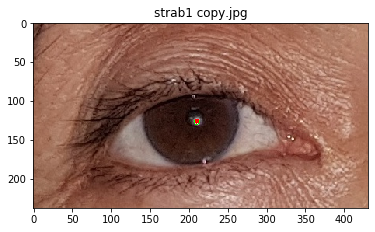

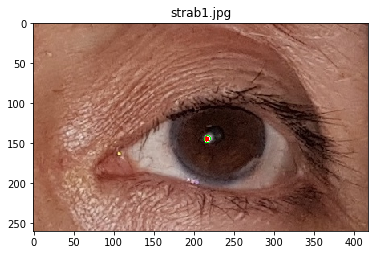

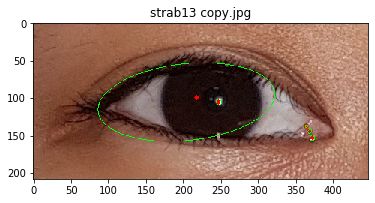

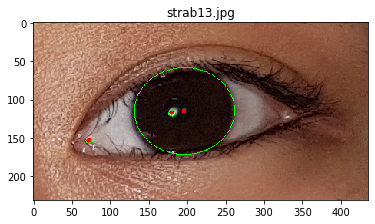

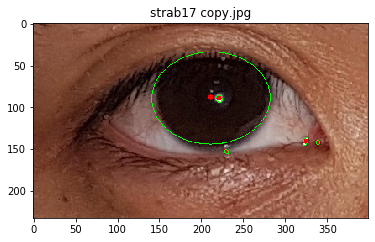

...

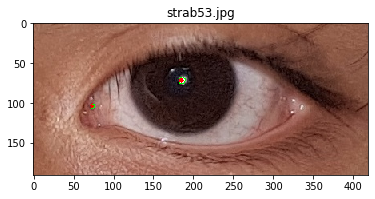

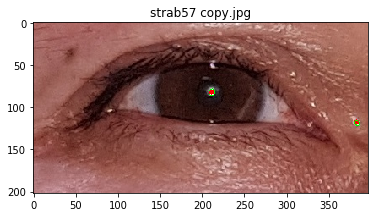

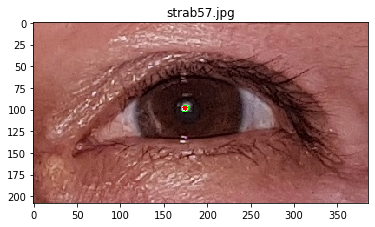

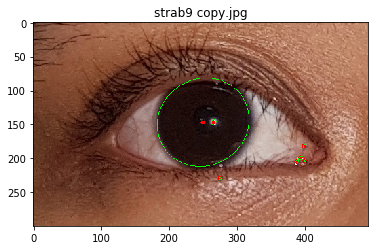

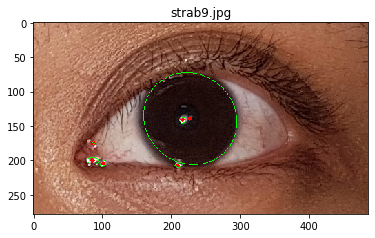

In [5]:
for root, dirs, files in os.walk(eyes_dir):
    for file in sorted(files):
        img = cv2.imread(str(root) + "/" + str(file))
        if img is not None:
            dl = detect_limbus(img)
            gb = get_brilliance(dl)
            
            plt.title(str(file))
#             plt.xticks([]),plt.yticks([])
            plt.imshow(gb)
#             plt.imsave('/Users/miggypinaroc/Desktop/CS/IndigoResearch/Strabismus/Manual Strabismus Detection/test_results/test1/' + str(file),gb)
            plt.show()

### test 2

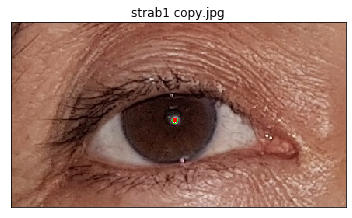

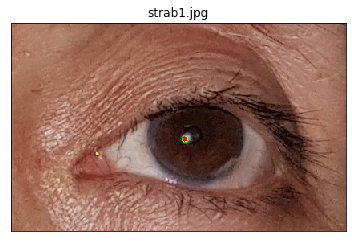

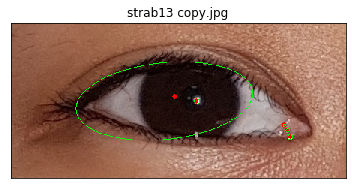

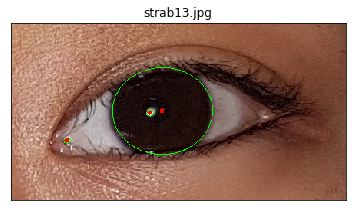

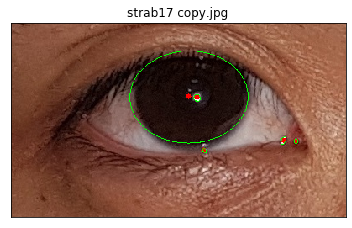

...

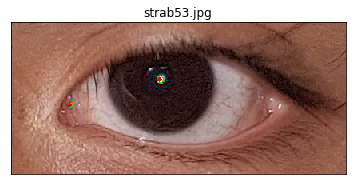

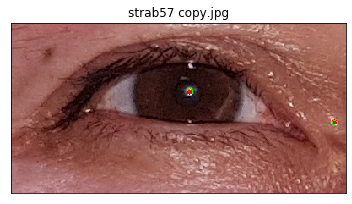

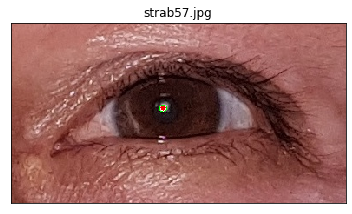

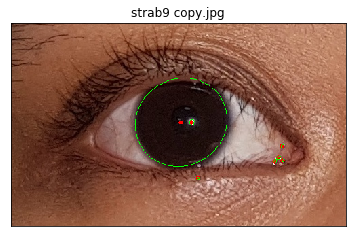

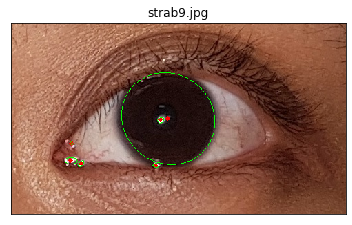

In [6]:
for root, dirs, files in os.walk(eyes_dir):
    for file in sorted(files):
        img = cv2.imread(str(root) + "/" + str(file))
        if img is not None:
            dl = detect_limbus(img)
            gb = get_brilliance(dl)
            
            plt.title(str(file))
            plt.xticks([]),plt.yticks([])
            plt.imshow(gb)
            plt.imsave('/Users/miggypinaroc/Desktop/CS/IndigoResearch/Strabismus/Manual Strabismus Detection/test_results/test2/' + str(file),gb)
            plt.show()

# Strabismus Test on the following images:
- A001d
- A006b x 
- A007d
- A018c
- A023c x
- A028c x
- A031a x

'/Users/miggypinaroc/Desktop/CS/IndigoResearch/Strabismus/Strabismus dataset/Strab photos group A/A006b.jpg'

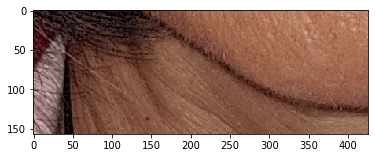

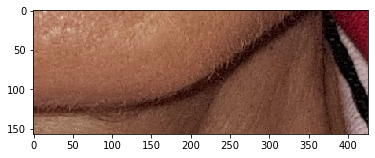

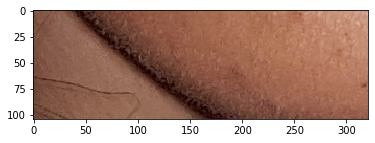

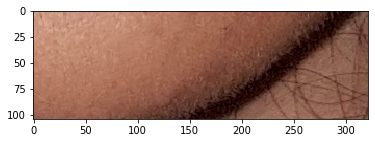

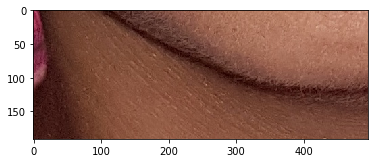

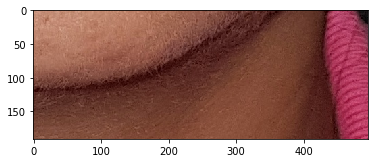

In [58]:
test = []
test_images = ['A001d','A006b','A007d','A018c','A023c','A028c','A031a']

for root,dirs,files in os.walk('/Users/miggypinaroc/Downloads/cropped_full'):
    for file in sorted(files):
        if file[:5] in test_images:
            img = cv2.imread(root + "/" + file)
            plt.imshow(img),plt.show()
            

### perform crop from files from the original A dataset

In [4]:
FACE_CLASSIFIER = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
EYE_CLASSIFIER = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')
def detect_faces(img, cascade):
    gray_frame = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    coords = cascade.detectMultiScale(gray_frame, 1.3, 5)
    if len(coords) > 1:
        biggest = (0, 0, 0, 0)
        for i in coords:
            if i[3] > biggest[3]:
                biggest = i
        biggest = np.array([i], np.int32)
    elif len(coords) == 1:
        biggest = coords
    else:
        return None
    for (x, y, w, h) in biggest:
        frame = img[y:y + h, x:x + w]
    return frame

def crop_eyes(img):  
    if img.shape is not None:
        height, width = img.shape[:2]
        eyes_h = int(height/2 - 100)
        forehead_h = int(eyes_h/3)
        img = img[forehead_h:eyes_h,0:width]
    else:
        return None
    return img

def cut_eyebrows(img):
    height, width = img.shape[:2]
    eyebrow_h = int(height / 4) + 7
    img = img[eyebrow_h:height, 0:width]  # cut eyebrows out (15 px)

    return img

def cut_eyes(img):
    height, width = img.shape[:2]
    img_l = img[0:height, 0:width//2]  # cut eyebrows out (15 px)
    img_r = img[0:height, width//2:width]  # cut eyebrows out (15 px)

    return img_l, img_r

In [60]:
test_names = []
for root, dirs, files in os.walk('/Users/miggypinaroc/Desktop/CS/IndigoResearch/Strabismus/Strabismus dataset/Strab photos group A'):
    for file in sorted(files):
        if file[:5] in test_images:
            test_names.append(file)
            img = cv2.imread(root + "/"+ file)
            test.append(img)

a001d, a006b, a007d

In [61]:
len(test)

3

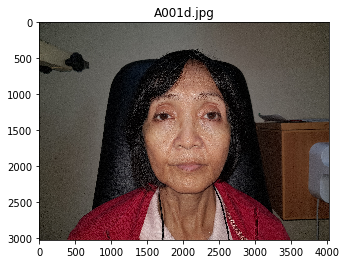

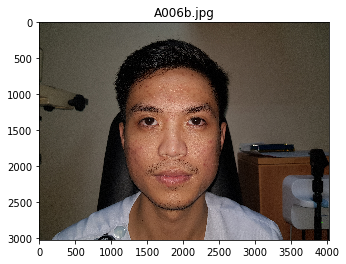

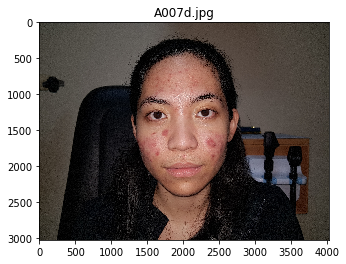

In [62]:
for t in range(len(test)):
    rgb_img = cv2.cvtColor(test[t], cv2.COLOR_BGR2RGB)
    plt.title(test_names[t])
    plt.imshow(rgb_img),plt.show()

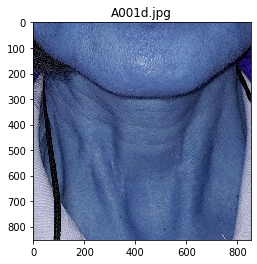

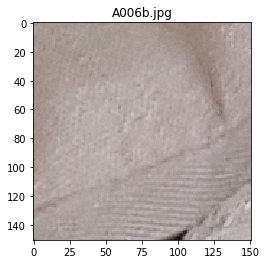

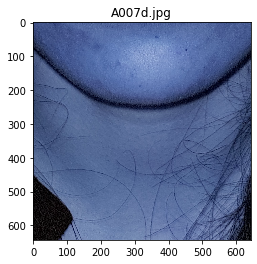

In [64]:
for t in range(len(test)):
    face_frame = detect_faces(test[t],FACE_CLASSIFIER)
    plt.imshow(face_frame)
    plt.title(test_names[t])
    plt.show()

Sample face_frame


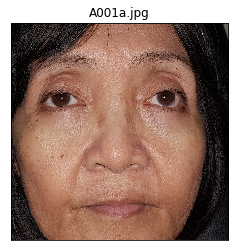

In [5]:
FACE_CLASSIFIER = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

def detect_faces(img, cascade):
    gray_frame = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    coords = cascade.detectMultiScale(gray_frame, 1.3, 5)
    if len(coords) > 1:
        biggest = (0, 0, 0, 0)
        for i in coords:
            if i[3] > biggest[3]:
                biggest = i
        biggest = np.array([i], np.int32)
    elif len(coords) == 1:
        biggest = coords
    else:
        return None
    for (x, y, w, h) in biggest:
        frame = img[y:y + h, x:x + w]
    return frame

for root, dirs, files in os.walk('/Users/miggypinaroc/Desktop/CS/IndigoResearch/Strabismus/Strabismus dataset/Strab photos group A'):
    files = sorted(files)
    img = cv2.imread(root + "/" + files[0])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    face_frame = detect_faces(img, FACE_CLASSIFIER)
    print('Sample face_frame')
    plt.imshow(face_frame)
    plt.title(files[0])
    plt.xticks([]),plt.yticks([])
    plt.show()
        

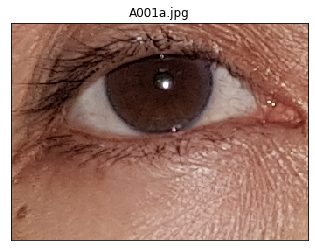

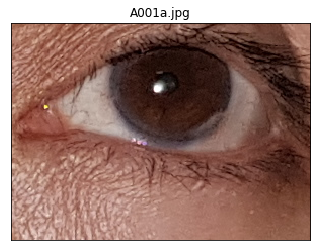

In [6]:
EYE_CLASSIFIER = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

def detect_eyes(img, cascade):
    gray_frame = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    eyes = cascade.detectMultiScale(gray_frame, 1.3, 5)  # detect eyes
    width = np.size(img, 1)  # get face frame width
    height = np.size(img, 0)  # get face frame height
    left_eye = None
    right_eye = None
    for (x, y, w, h) in eyes:
        if y > height / 2:
            pass
        eyecenter = x + w / 2  # get the eye center
        if eyecenter < width * 0.5:
            left_eye = img[y:y + h, x:x + w]
        else:
            right_eye = img[y:y + h, x:x + w]
            
    return left_eye, right_eye

eye_frame = detect_eyes(face_frame,EYE_CLASSIFIER)
for eye in eye_frame:
    eye = cut_eyebrows(eye)
    plt.imshow(eye)
    plt.title(files[0])
    plt.xticks([]),plt.yticks([])
    plt.show()

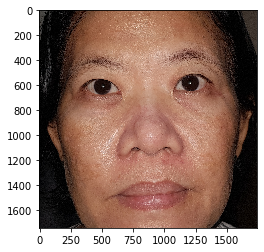

(<matplotlib.image.AxesImage at 0x1244b4f28>, None)

In [7]:
img = cv2.imread('/Users/miggypinaroc/Desktop/CS/IndigoResearch/Strabismus/Strabismus dataset/test1/strab45.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
ff = detect_faces(img, FACE_CLASSIFIER)
plt.imshow(ff),plt.show()

In [9]:
ee = detect_eyes(ff, EYE_CLASSIFIER)
# for e in ee:
#     e = cut_eyebrows(e)
#     de = detect_limbus(e, 50)
    
#     plt.imshow(de),plt.show()

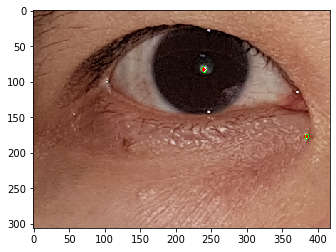

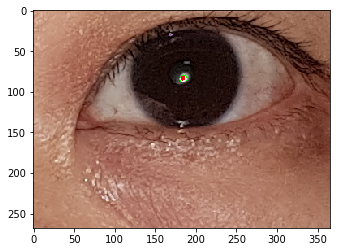

In [12]:
for e in ee:
    e = cut_eyebrows(e)
    gb = get_brilliance(e)
    plt.imshow(gb),plt.show()

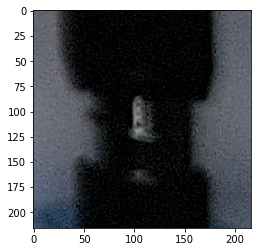

In [17]:
img2 = cv2.imread('/Users/miggypinaroc/Downloads/A031a.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img2 = detect_faces(img2,FACE_CLASSIFIER)
plt.imshow(img2)

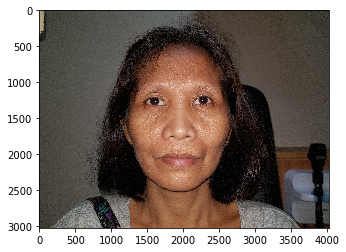

In [16]:
img2 = cv2.imread('/Users/miggypinaroc/Downloads/A031a.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

plt.imshow(img2)

TypeError: Image data of dtype object cannot be converted to float

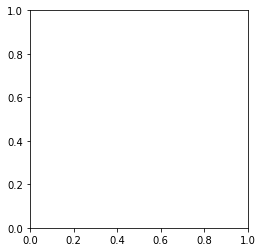

In [18]:
img2 = cv2.imread('/Users/miggypinaroc/Downloads/A031a.jpg')
img2 = detect_eyes(img2, EYE_CLASSIFIER)
plt.imshow(img2)